In [1]:
import os
import numpy as np
import ipywidgets as widgets
import matplotlib.pyplot as plt

%reload_ext autoreload
%autoreload 1
%aimport src.properties
%aimport src.simulation
%aimport src.reconstruction
%aimport src.utils

from src.properties import Properties
from src.simulation import Simulation
from src.reconstruction import Reconstruction
import src.utils as utils

In [2]:
image_extensions = ('.bmp', '.jpg', '.jpeg', '.png', '.tif', '.tiff')
image_directory = 'images'
image_files = [f for f in os.listdir(image_directory) if f.lower().endswith(image_extensions)]

image_dropdown = widgets.Dropdown(options=image_files, value='SADDLE_PE.jpg', description='Select image:')
scans_slider = widgets.IntSlider(value=540, min=10, max=1080, step=10, description='Scans:')
detectors_slider = widgets.IntSlider(value=360, min=10, max=1000, step=10, description='Detectors:')
angular_span_slider = widgets.IntSlider(value=270, min=10, max=360, step=10, description='Angular span:')
apply_filter_checkbox = widgets.Checkbox(value=True, description='Apply filter')
animate_checkbox = widgets.Checkbox(value=True, description='Animate')

display(widgets.VBox([image_dropdown,
                      scans_slider,
                      detectors_slider,
                      angular_span_slider,
                      apply_filter_checkbox,
                      animate_checkbox]))



Original image:


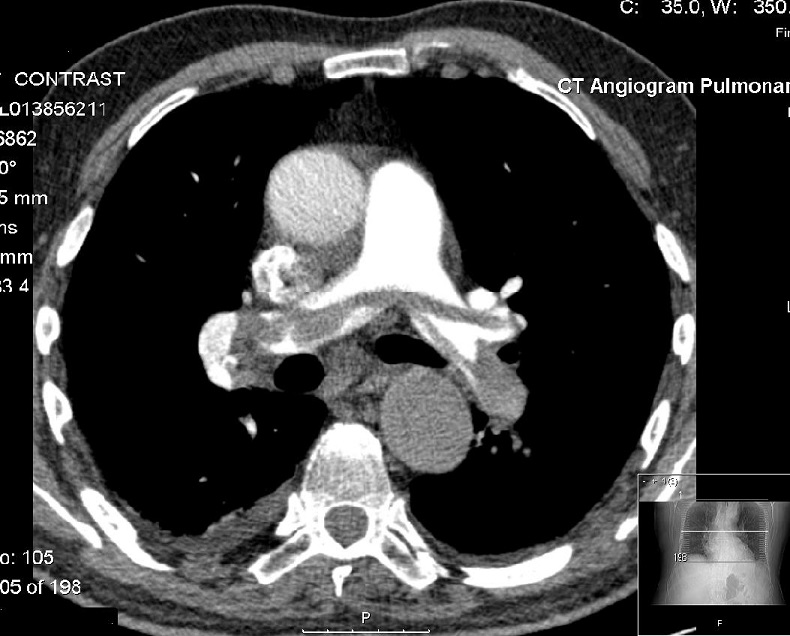



Sinogram:



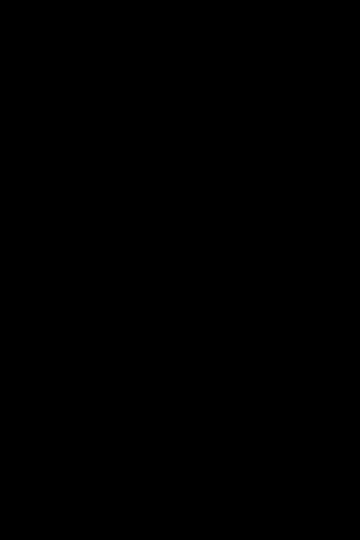



Tomogram:



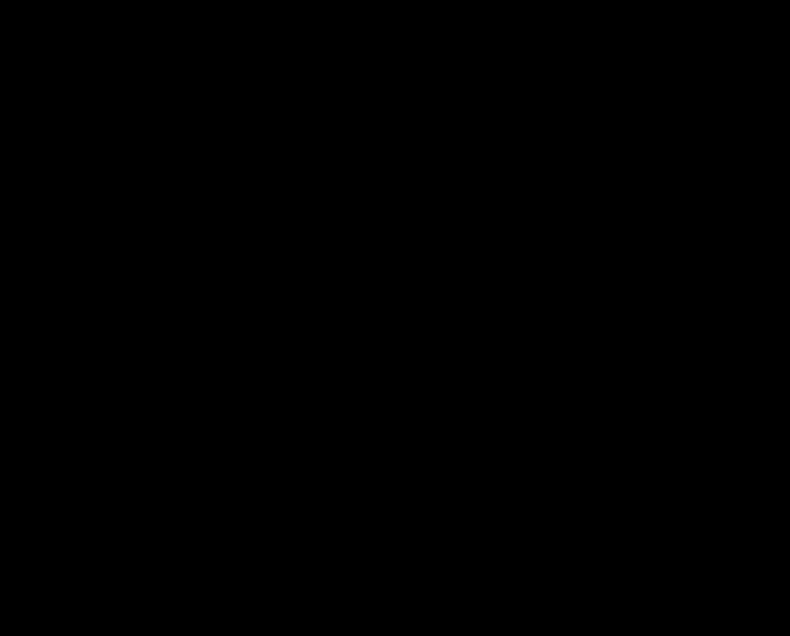



Filtered sinogram:


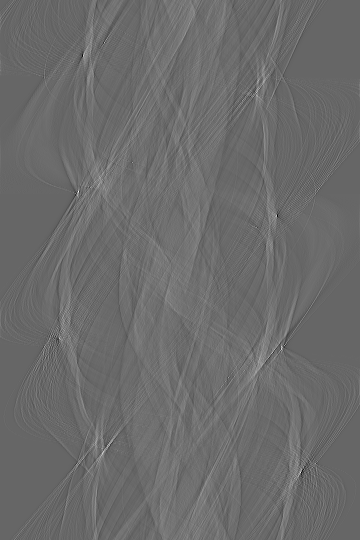



Filtered tomogram:


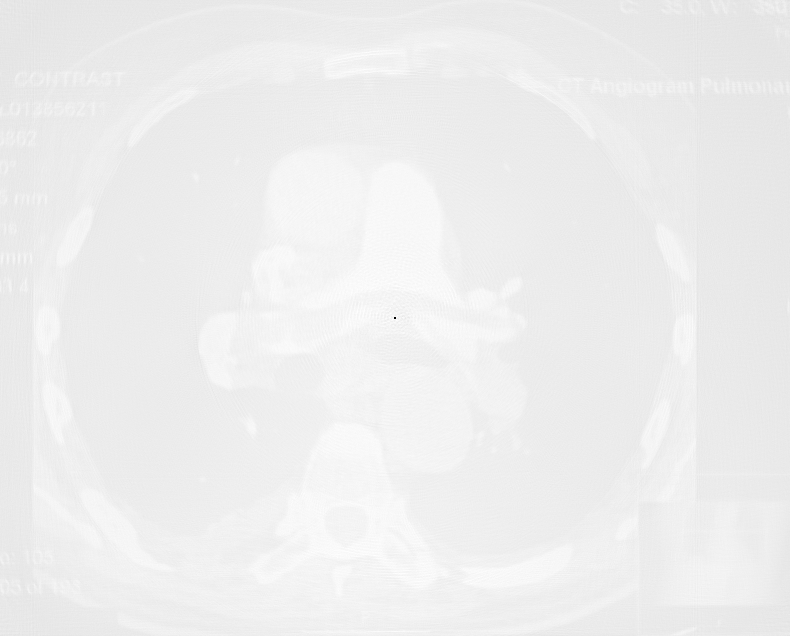



Adjusted and filtered tomogram:


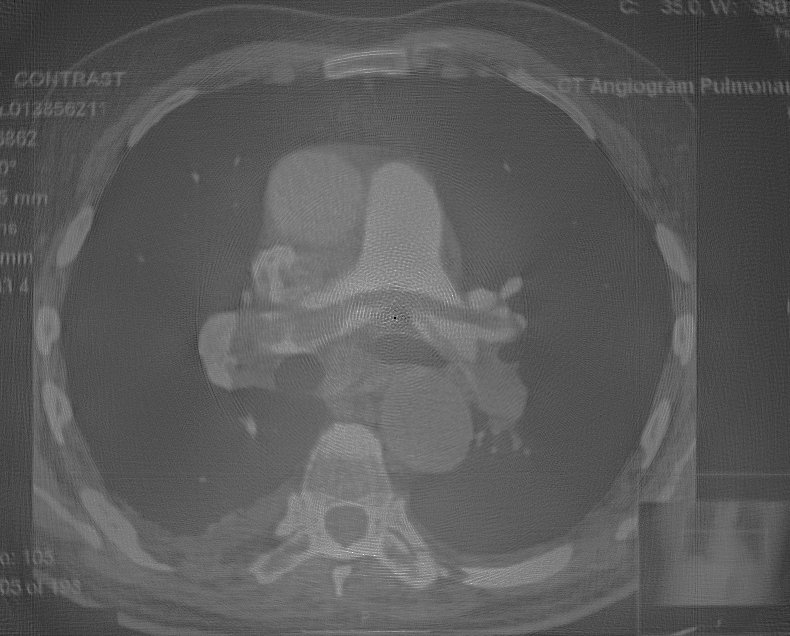

In [3]:
def showcase(image_path, scans, detectors, angular_span, apply_filter, animate):
    properties = Properties(os.path.join(image_directory, image_path), scans, detectors, angular_span)
    simulation = Simulation(properties)
    reconstruction = Reconstruction(properties, simulation, apply_filter)

    print('\n\nOriginal image:')
    utils.display_image(properties.image)
    print('\n\nSinogram:')
    if not animate:
        utils.display_image(simulation.sinogram)
    else:
        sinogram_animation = utils.create_animation(properties, simulation.sinogram.shape, simulation.raw_sinogram_max,
                                                    lambda sb, se, wa: utils.radon_transform(properties, wa, sb, se))
        display(sinogram_animation)
    print('\n\nTomogram:')
    if not animate:
        utils.display_image(reconstruction.tomogram)
    else:
        tomogram_animation = utils.create_animation(properties, reconstruction.tomogram.shape, reconstruction.raw_tomogram_max,
                                                    lambda sb, se, wa: utils.inverse_radon_transform(properties, simulation.sinogram, wa, sb, se))
        display(tomogram_animation)
    if apply_filter:
        print('\n\nFiltered sinogram:')
        utils.display_image(reconstruction.filtered_sinogram)
        print('\n\nFiltered tomogram:')
        utils.display_image(reconstruction.filtered_tomogram)
        print('\n\nAdjusted and filtered tomogram:')
        utils.display_image(reconstruction.adjusted_tomogram)

showcase(image_dropdown.value,
         scans_slider.value,
         detectors_slider.value,
         angular_span_slider.value,
         apply_filter_checkbox.value,
         animate_checkbox.value)



[1] RMSE values during the inverse Radon transform:


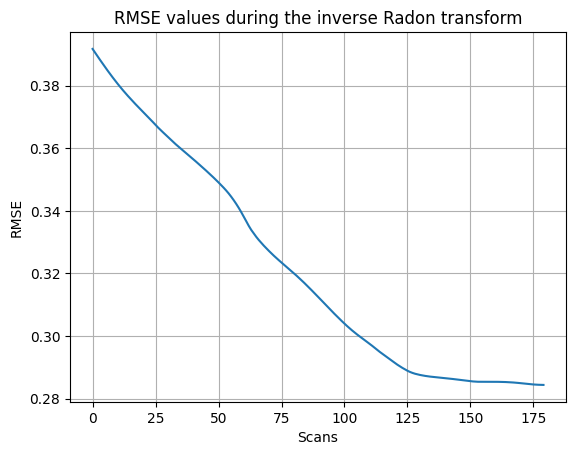



[2] RMSE values for varying parameters:


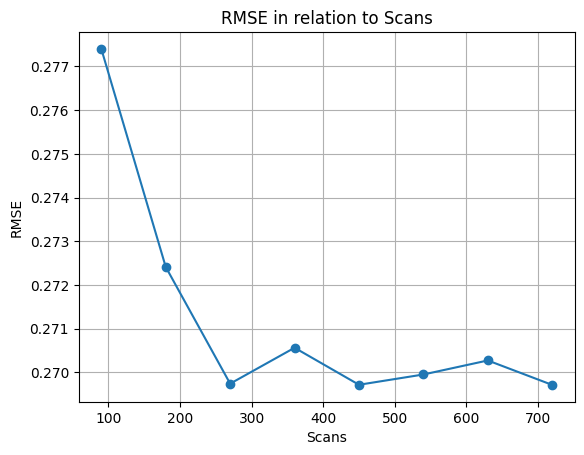

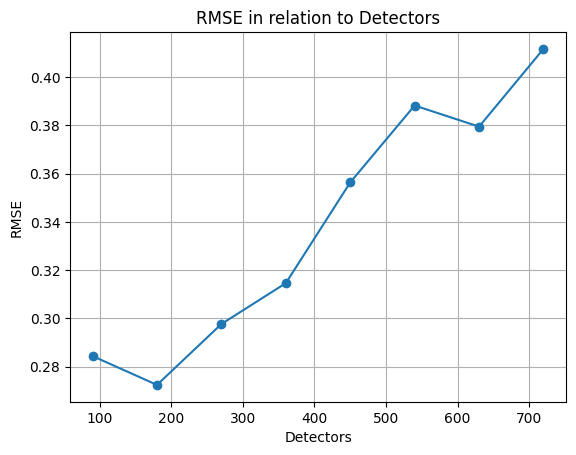

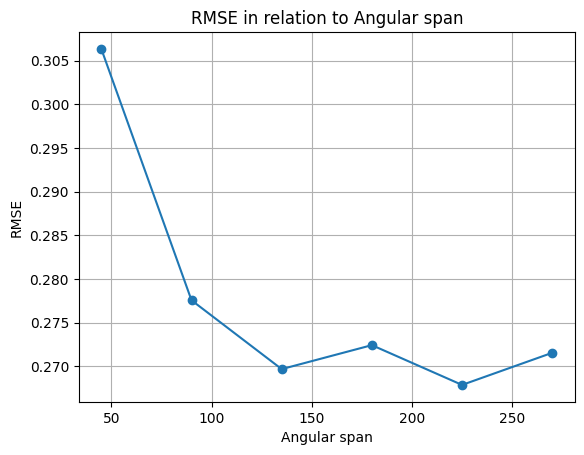



[3] RMSE values before and after applying filter:

Original image:


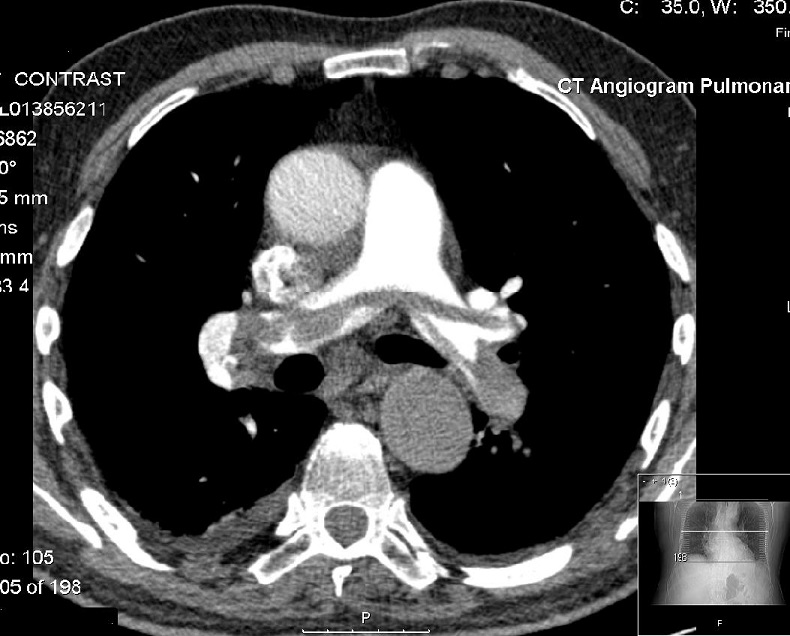



Tomogram:
RMSE: 0.295


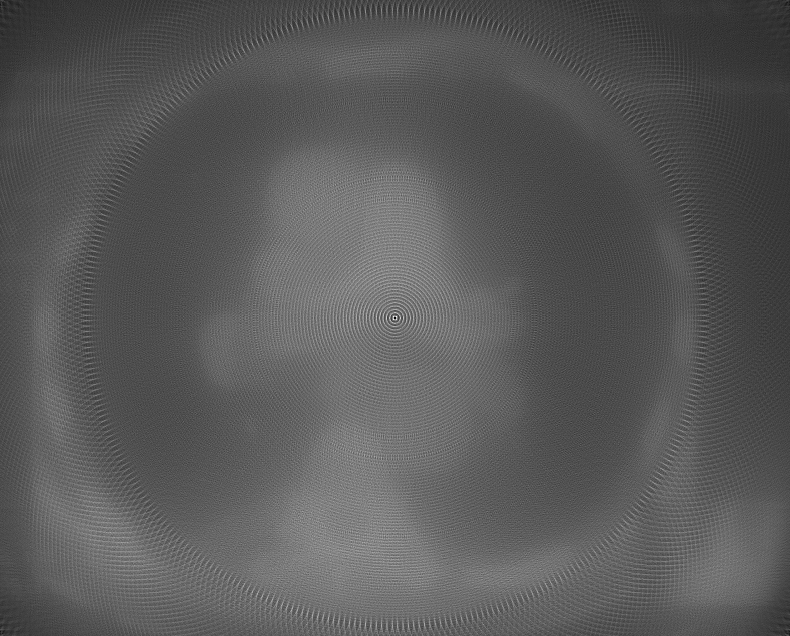



Adjusted and filtered tomogram:
RMSE: 0.280


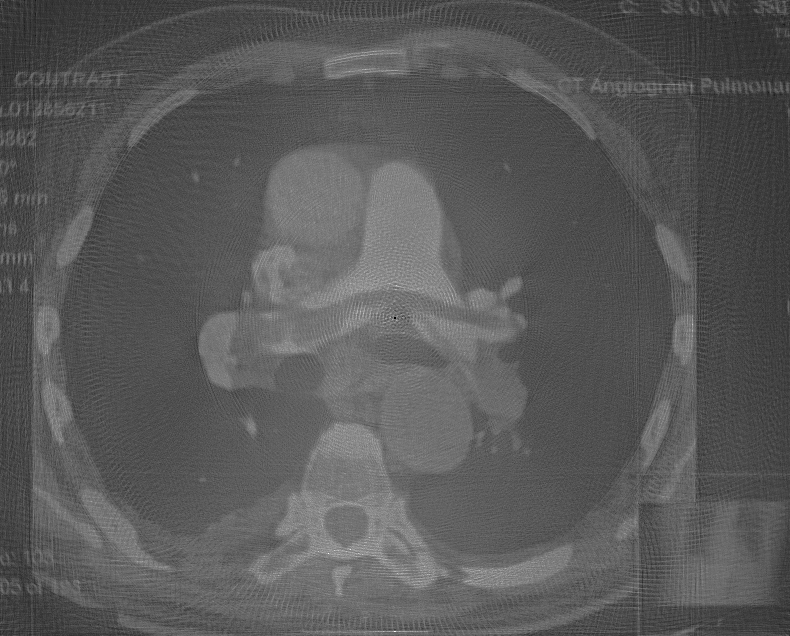

In [4]:
image_path = os.path.join(image_directory, 'SADDLE_PE.jpg')

def calculate_rmse(original, reconstructed):
    return np.sqrt(np.mean((original - reconstructed) ** 2))

def create_rmse_during_inverse_radon_graph(image_path):
    rmse_values = []
    properties = Properties(image_path, 180, 180, 180)
    simulation = Simulation(properties)

    helper_tomogram = np.zeros(properties.image.shape, dtype=np.float32)
    utils.inverse_radon_transform(properties, simulation.sinogram, helper_tomogram)
    raw_tomogram_max = np.max(helper_tomogram)

    working_tomogram = np.zeros(properties.image.shape, dtype=np.float32)

    for i in range(properties.scans):
        utils.inverse_radon_transform(properties, simulation.sinogram, working_tomogram, i, i + 1)
        rmse_values.append(calculate_rmse(properties.image, working_tomogram / raw_tomogram_max))

    plt.figure()
    plt.plot(range(properties.scans), rmse_values)
    plt.title(f'RMSE values during the inverse Radon transform')
    plt.xlabel('Scans')
    plt.ylabel('RMSE')
    plt.grid()
    plt.show()

print('\n\n[1] RMSE values during the inverse Radon transform:')
create_rmse_during_inverse_radon_graph(image_path)

def create_rmse_varying_params_graph(image_path, type, range):
    scans = 180
    detectors = 180
    angular_span = 180
    rmse_values = []

    for value in range:
        if type == 'scans':
            scans = value
        elif type == 'detectors':
            detectors = value
        elif type == 'angular span':
            angular_span = value

        properties = Properties(image_path, scans, detectors, angular_span)
        simulation = Simulation(properties)
        reconstruction = Reconstruction(properties, simulation, apply_filter=True)
        rmse_values.append(calculate_rmse(properties.image, reconstruction.adjusted_tomogram))

    plt.figure()
    plt.plot(range, rmse_values, marker='o')
    plt.title(f'RMSE in relation to {type.capitalize()}')
    plt.xlabel(type.capitalize())
    plt.ylabel('RMSE')
    plt.grid()
    plt.show()

print('\n\n[2] RMSE values for varying parameters:')
create_rmse_varying_params_graph(image_path, 'scans', range(90, 720 + 1, 90))
create_rmse_varying_params_graph(image_path, 'detectors', range(90, 720 + 1, 90))
create_rmse_varying_params_graph(image_path, 'angular span', range(45, 270 + 1, 45))

def create_rmse_filter_comparison(image_path):
    scans = 360
    detectors = 360
    angular_span = 270

    properties = Properties(image_path, scans, detectors, angular_span)
    simulation = Simulation(properties)
    reconstruction = Reconstruction(properties, simulation, apply_filter=True)
    rmse_1 = calculate_rmse(properties.image, reconstruction.tomogram)
    rmse_2 = calculate_rmse(properties.image, reconstruction.adjusted_tomogram)

    print('\nOriginal image:')
    utils.display_image(properties.image)
    print('\n\nTomogram:')
    print(f'RMSE: {rmse_1:.3f}')
    utils.display_image(reconstruction.tomogram)
    print('\n\nAdjusted and filtered tomogram:')
    print(f'RMSE: {rmse_2:.3f}')
    utils.display_image(reconstruction.adjusted_tomogram)

print('\n\n[3] RMSE values before and after applying filter:')
create_rmse_filter_comparison(image_path)